## Advanced Lane Finding

In this project, my goal is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car. The project assumes that the front facing camera on the car is fixed at the center of the vehicle and the vehicle is driven on a road with fairly level surface.

In [1]:
#!/home/ashish/anaconda3/bin/python

from utils import *
from camera_calibration import *
from perspective_transform import *
from lane_detector import *
from IPython.core.display import display, HTML
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
# Paths
output_images_dir = "output_images/"
test_images_dir = "test_images/"
more_test_images_dir = "more_test_images/"

Below I show the execution and results for 3 sections from the <a href="https://review.udacity.com/#!/rubrics/1966/view">Rubics</a> for the project, namely, 
1. Camera Calibration
2. Lane Detection Pipeling on Project Test Images
3. Lane Detection Pipeling on Project Test Video

#### Camera Calibration

In [3]:
# Perform camera calibration
camera_calibrator = ChessboardCameraCalibrator(init_calibration=False)

In [4]:
camera_calibrator.calibrate_camera()

Camera calibration successful with reprojection error 1.186897 (RMS)


True

In [5]:
# visually verify calibration result
# if we are unable to find corners for some images, 
# visually verify on them, else use some sample chessboard images

input_fnames = camera_calibrator.no_corners_found

if len(input_fnames) == 0:
    input_fnames.append("camera_cal/calibration1.jpg")
    input_fnames.append("camera_cal/calibration2.jpg")
    input_fnames.append("camera_cal/calibration3.jpg")

input_images = []
output_images = []
output_fnames = []

for fname in input_fnames:
    name, ext = os.path.splitext(os.path.basename(fname))
    out_fname = os.path.join(output_images_dir, name+"_undist"+ext)
    # undistort image
    distorted = cv2_imread_rgb(fname)
    undistorted = camera_calibrator.undistort_image(distorted)
    # write to disk
    cv2_imwrite_rgb(out_fname, undistorted)
    # save for display
    input_images.append(distorted)
    output_images.append(undistorted)
    output_fnames.append(out_fname)


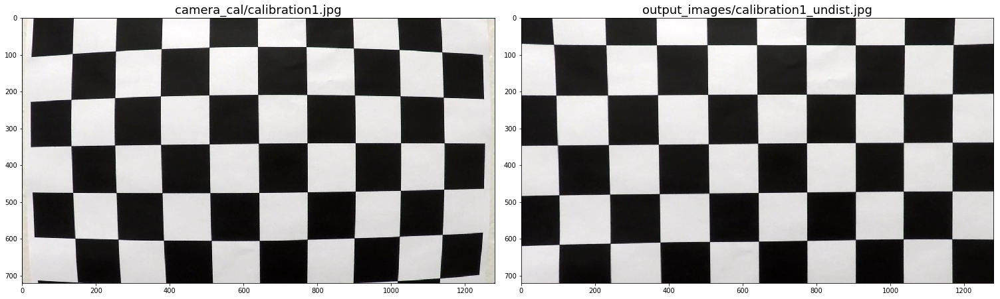

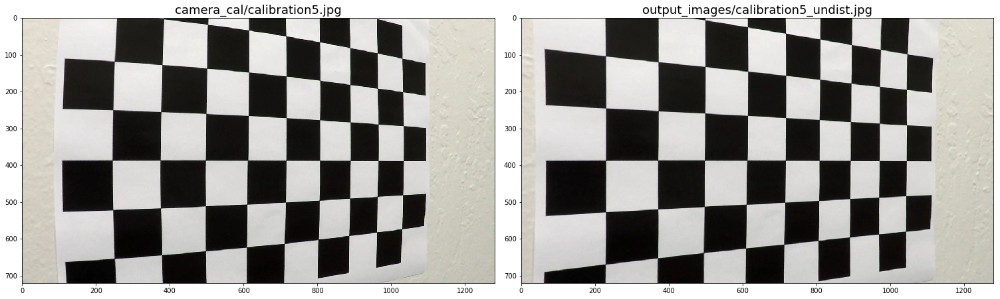

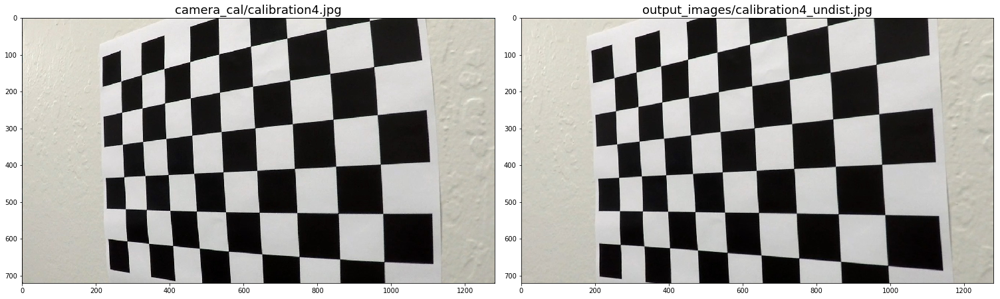

In [6]:
# display the images
for i_name, i_img, o_name, o_img in zip(input_fnames, input_images, output_fnames, output_images):
    plot_images([i_img, o_img], titles=[i_name, o_name], cols=2, fontsize=18)

#### Lane Detection Pipeling (single images)

##### Apply undistortion to test images and display results.

In [7]:
# call the 'test_camera_calibration_and_undistortion' to undistort test images
ret_val = test_camera_calibration_and_undistortion()

Testing camera calibration and undistortion...
Camera calibration successful with reprojection error 1.186897 (RMS)
Camera calibration and undistortion test DONE. Undistorted images saved to 'output_images/' folder.


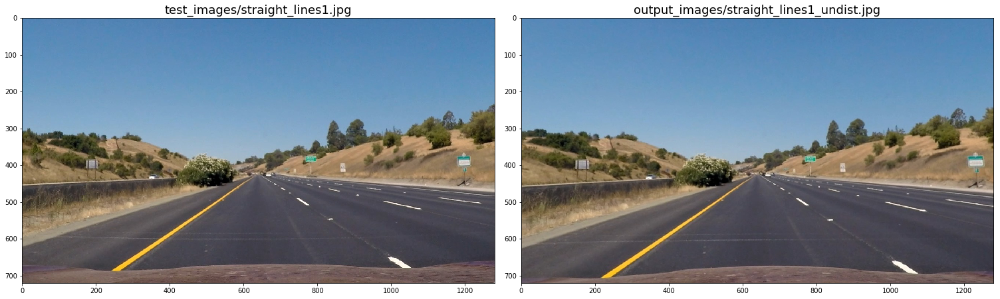

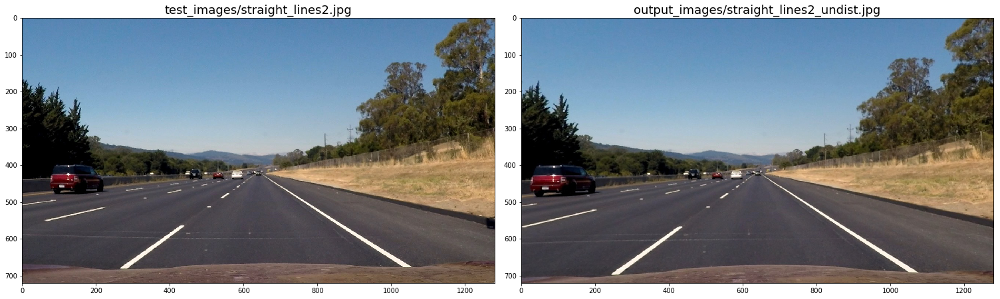

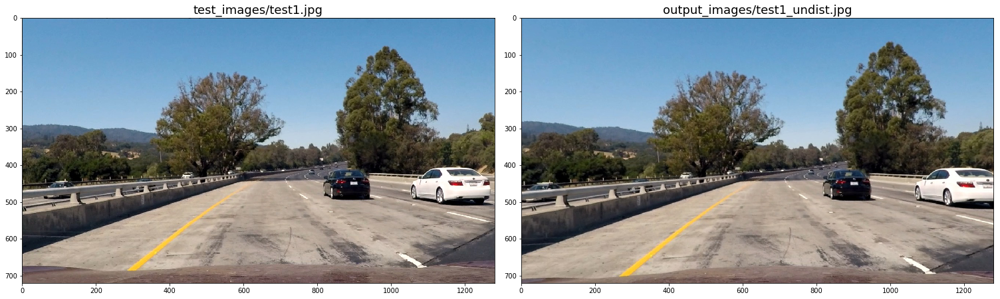

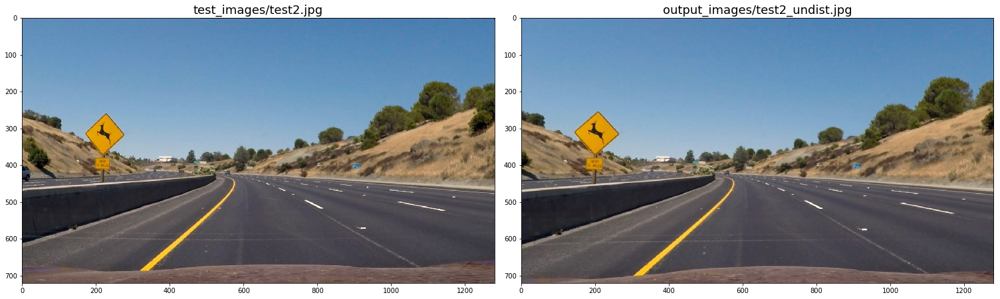

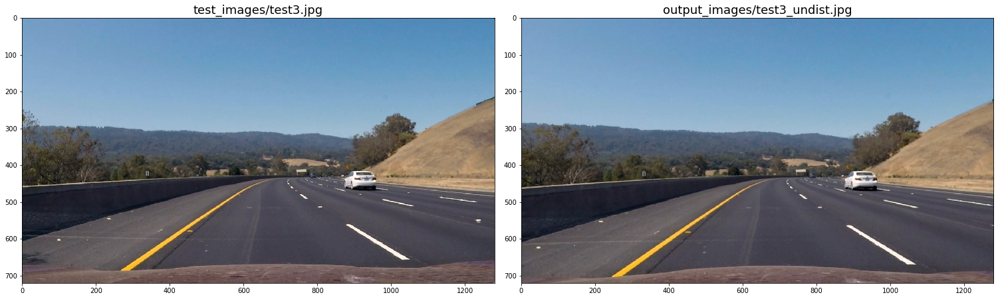

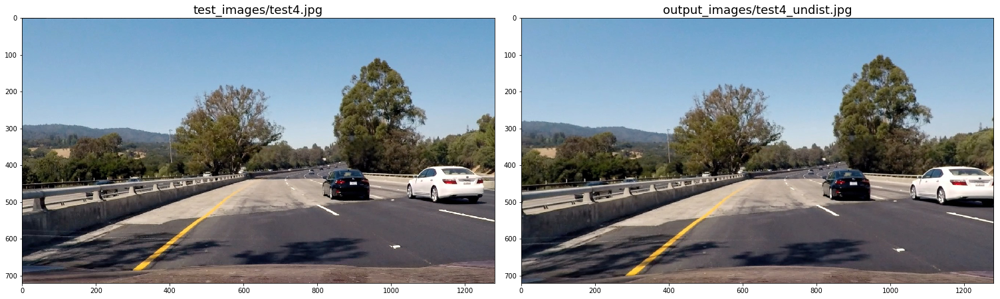

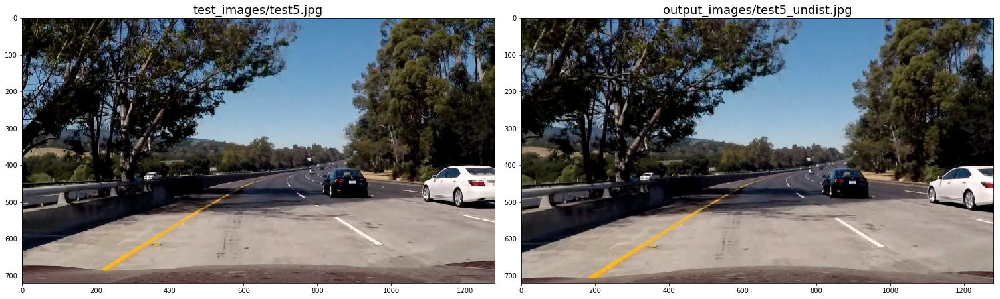

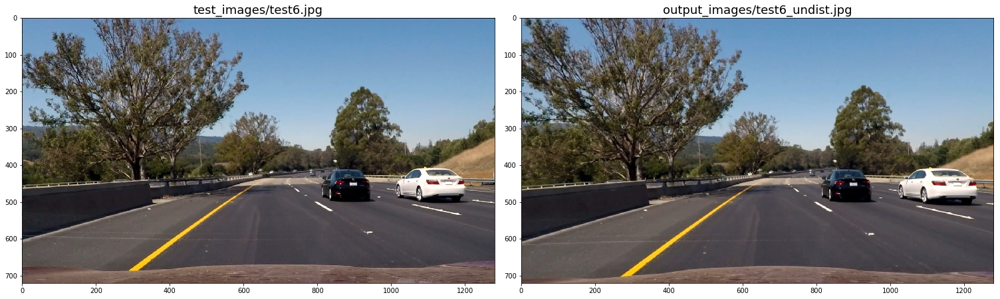

In [9]:
# display the results
if ret_val is True:
    test_images = glob.glob(os.path.join(test_images_dir, '*.jpg'))
    for fname in sorted(test_images):
        name, ext = os.path.splitext(os.path.basename(fname))
        undist_image_name = os.path.join(output_images_dir, name + "_undist" + ext)
        plot_images([cv2_imread_rgb(fname), cv2_imread_rgb(undist_image_name)], 
                    titles=[fname, undist_image_name], cols=2, fontsize=18)

##### Generate thresholded binary images

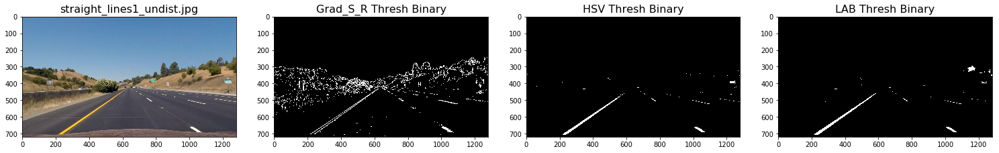

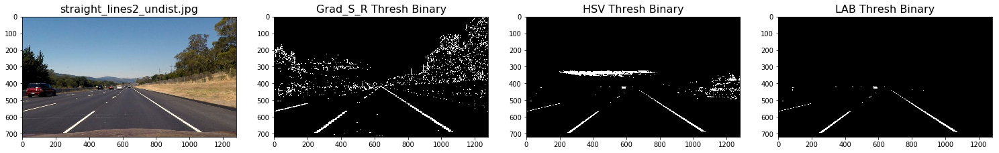

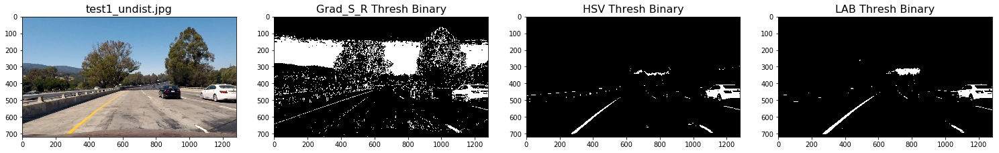

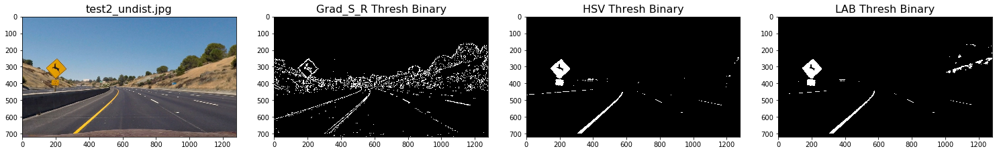

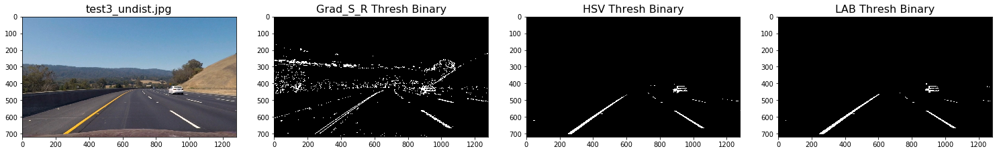

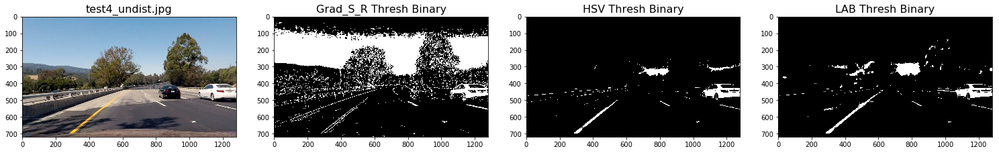

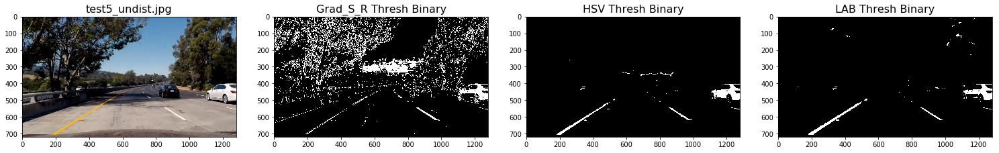

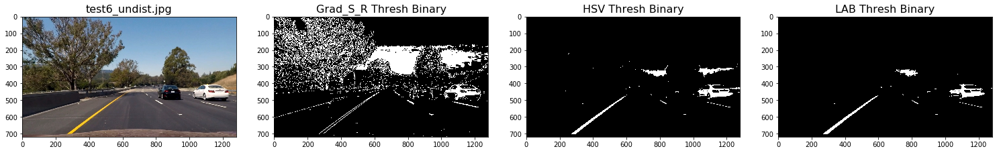

In [10]:
# This code snippet tests 3 binary thresholding methods 
undist_test_images = glob.glob(os.path.join(output_images_dir, "t*_undist.jpg"))
undist_test_images.extend(glob.glob(os.path.join(output_images_dir, "s*_undist.jpg")))

for fname in sorted(undist_test_images):
    undistorted_image = cv2_imread_rgb(fname)

    # get the thresholded binary image
    color_binary, gradSR_thresh_binary = get_thresholded_binary(undistorted_image)
    hsv_thresh_binary = get_HSV_threshold_binary(undistorted_image)

    # LAB-L and LAB-B thresholds
    l_thresh = (210, 255)
    b_thresh = (190, 255)
    lab_ch_l, lab_ch_b, lab_l_binary, lab_b_binary, lab_thresh_binary = get_LAB_threshold_binary(undistorted_image,
                                                                                             l_thresh=l_thresh,
                                                                                             b_thresh=b_thresh)
    
    # save the output
    cv2.imwrite(fname.replace("undist", "GSR_binary"), gradSR_thresh_binary.astype('uint8') * 255)
    cv2.imwrite(fname.replace("undist", "HSV_binary"), hsv_thresh_binary.astype('uint8') * 255)
    cv2.imwrite(fname.replace("undist", "LAB_binary"), lab_thresh_binary.astype('uint8') * 255)
    
    plot_images([undistorted_image, gradSR_thresh_binary, hsv_thresh_binary, lab_thresh_binary], 
                titles=[os.path.basename(fname), "Grad_S_R Thresh Binary", "HSV Thresh Binary", "LAB Thresh Binary"], 
                cols=4, fontsize=16)

The HSV thresholded binary looks good, but the LAB threshold binary looks cleaner and better. The combinations of gradient (sobel), S channel, and R channel thresholding doesn't seem to be at par with the other two.

Lets work with the LAB threshold binary!

##### Perspective Transform Verification

PerspectiveTransform Initialized


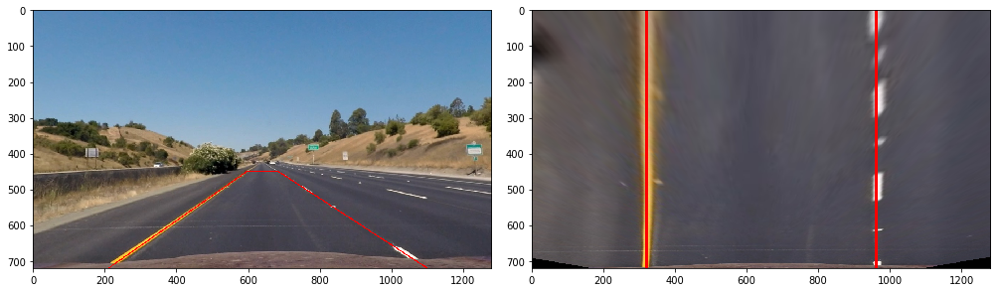

In [11]:
# Verify the perspective transform on 'straight_lines1.jpg' test image
fname = "output_images/straight_lines1_undist.jpg"
undistorted_image = cv2_imread_rgb(fname)

image_src_poly, warped_image_dst_lines = visually_verify_perspective_transform(undistorted_image)

# save the output for writeup
cv2_imwrite_rgb(fname.replace("undist", "src_poly"), image_src_poly)
cv2_imwrite_rgb(fname.replace("undist", "dst_lines"), warped_image_dst_lines)

plot_images([image_src_poly, warped_image_dst_lines])

##### Lane-line Pixels with Polynomial Fit

In [12]:
ld = LaneDetector(enable_smoothing=False)

Camera calibration successful with reprojection error 1.186897 (RMS)
PerspectiveTransform Initialized


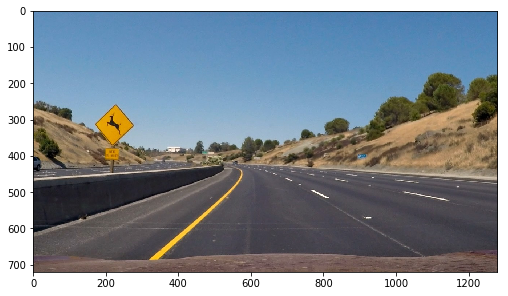

In [13]:
ld.reset()
fname = "test_images/test2.jpg"
img = cv2_imread_rgb(fname)
plot_images([img])

In [14]:
def get_binary_polynomial_image(binary_warped, binary_pixels, left_fitx, right_fitx, fontsize=8):

    leftx, lefty, rightx, righty = binary_pixels
    binary_polynomial_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])

    ## Visualization ##
    # Colors in the left and right lane regions
    binary_polynomial_img[lefty, leftx] = [255, 0, 0]
    binary_polynomial_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    plt.text(400, 500, r'$f_{left}(y) = A_{left}y^2 + B_{left}y + C_{left}$', color='y', fontsize=fontsize)
    plt.text(350, 100, r'$f_{right}(y) = A_{right}y^2 + B_{right}y + C_{right}$', color='y', fontsize=fontsize)
    plt.arrow(420, 520, -40, 60, linewidth=0.5, head_width=10, head_length=10, fc='y', ec='y')
    plt.arrow(800, 120, 85, 40, linewidth=0.5, head_width=10, head_length=10, fc='y', ec='y')

    return binary_polynomial_img


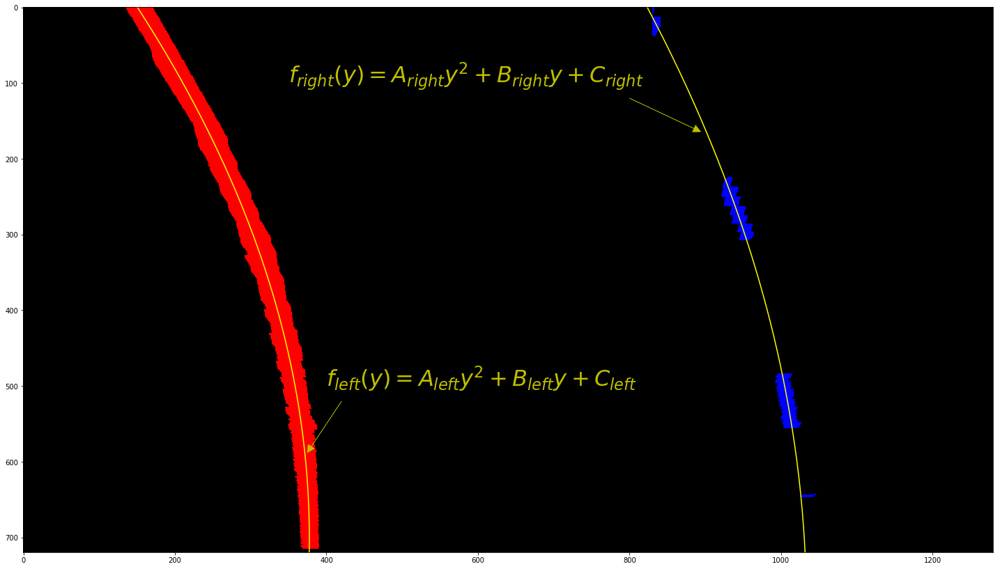

In [15]:
# undistort the image
undistorted_img = ld.camera_calibrator.undistort_image(img)

# LAB Binary Thresholding
_, _, _, _, thresh_binary = get_LAB_threshold_binary(undistorted_img)
# perspective transform
binary_warped = ld.perspective_transform.transform_image(thresh_binary)
# find lane pixels
retval = ld.find_lane_pixels(binary_warped)

if retval is True:
    # fit polynomial
    ld.fit_polynomial(binary_warped)
    # retrieve the fit data
    leftx = ld.left_lane_line.allx
    lefty = ld.left_lane_line.ally
    rightx = ld.right_lane_line.allx
    righty = ld.right_lane_line.ally
    left_fitx = ld.left_lane_line.bestx
    right_fitx = ld.right_lane_line.bestx

    # plot the binary image with the lane pixels and polynomial fit
    plt.figure(figsize=(25.6, 14.4))
    binary_polynomial_img = get_binary_polynomial_image(binary_warped, 
                                                        (leftx, lefty, rightx, righty), 
                                                        left_fitx, 
                                                        right_fitx, fontsize=32)
    plt.imshow(binary_polynomial_img)
    plt.show()
else:
    print("Error: Couldn't find lane pixels.")

##### Lane Detection on Test Images

In [16]:
ld = LaneDetector(enable_smoothing=False)

Camera calibration successful with reprojection error 1.186897 (RMS)
PerspectiveTransform Initialized


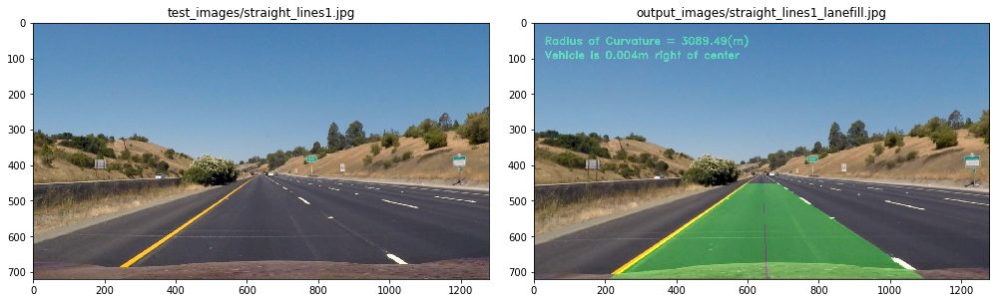

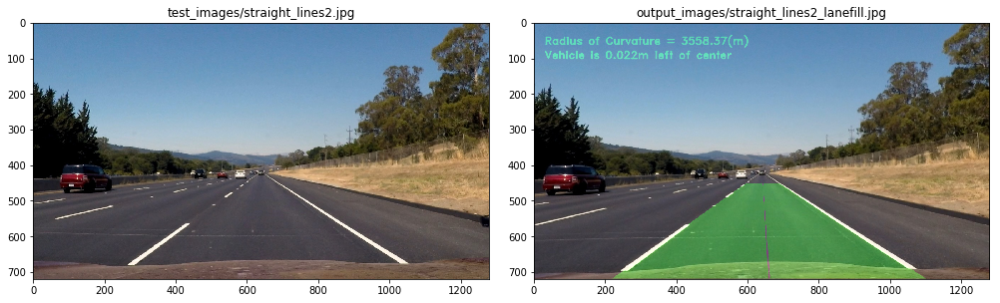

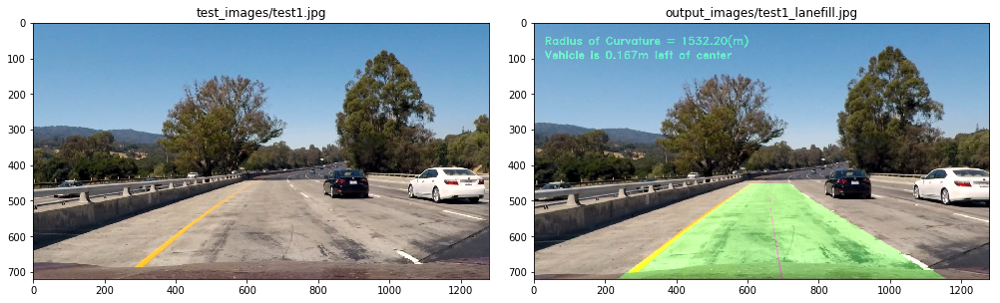

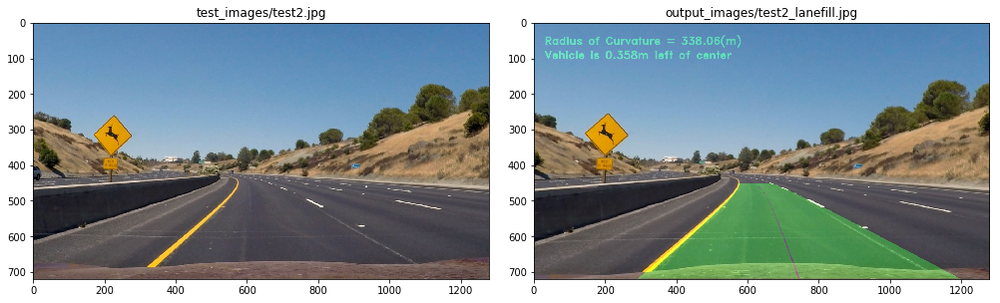

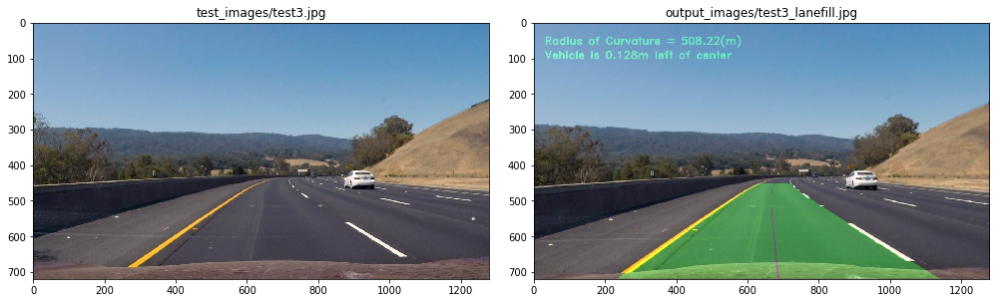

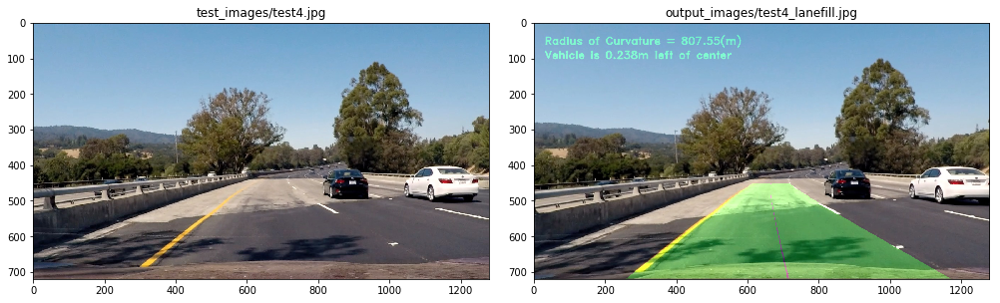

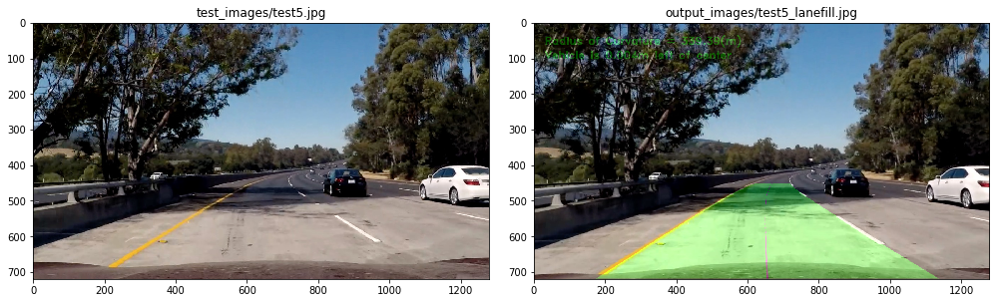

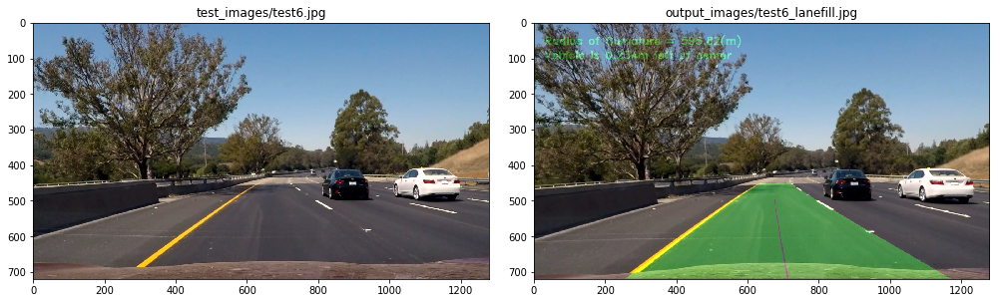

In [17]:
images = glob.glob("test_images/straight_lines*.jpg")
images.extend(glob.glob("test_images/test*.jpg"))

for fname in sorted(images):
    
    img = cv2_imread_rgb(fname)
    
    lane_fill_img = ld.process_image(img, display_binary_images=False)

    name, ext = os.path.splitext(os.path.basename(fname))
    lane_fill_img_name = os.path.join(output_images_dir, name + "_lanefill" + ext)
    cv2_imwrite_rgb(lane_fill_img_name, lane_fill_img)
    plot_images([img, lane_fill_img], titles=[fname, lane_fill_img_name])
    
    ld.reset()



#### Lane Detection Pipeling on Project Test Video

In [18]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [19]:
lane_detector = LaneDetector()

Camera calibration successful with reprojection error 1.186897 (RMS)
PerspectiveTransform Initialized


In [20]:
def process_image(img):
    return lane_detector.process_image(img)
    
def process_video(video_fname):
    
    clip1 = VideoFileClip(video_fname)
    video_clip = clip1.fl_image(process_image)

    return video_clip

In [21]:
video_output = 'output_images/project_video_lanefill.mp4'
video_clip = process_video("project_video.mp4")

video_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_lanefill.mp4
[MoviePy] Writing video output_images/project_video_lanefill.mp4


100%|█████████▉| 1260/1261 [02:47<00:00,  8.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video_lanefill.mp4 



In [22]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))